In [2]:
import geopandas as gpd
from shapely.ops import unary_union
import rasterio as rio
from rasterio.plot import show
import rioxarray as riox
import contextily as ctx
from rasterio.merge import merge
import georasters as gr
from shapely.geometry import Point
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import matplotlib.patches as mpatches

/Users/luisali/miniconda3/envs/dstemp/lib/python3.11/site-packages/libpysal/cg/alpha_shapes.py:38: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @jit
/Users/luisali/miniconda3/envs/dstemp/lib/python3.11/site-packages/libpysal/cg/alpha_shapes.py:164: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @jit
/Users/luisali/miniconda3/envs/dstemp/lib/python3.11/site-packa

In [3]:
# reading the shapefile for towns in masachusetts
munis = gpd.read_file('../altitude/shapefile_mass/TOWNSSURVEY_POLY.shp')
munis = munis.to_crs(epsg=4326)

### Elevation Analysis

In [4]:
# reading in the geotiff file
ele = gr.from_file("mass_clipped.tif")

# putting the data in a pandas dataframe
ele = ele.to_pandas()

# renaming the columns for clarity
ele = ele.rename(columns={True:"Elevation", "x":"Longitude", "y":"Latitude"})

# dropping the row and col columns, as they are not needed for our analysis
ele = ele.drop(['row', 'col'],axis=1)

# converting the pandas dataframe to a geopandas dataframe with a geometry column
geometry = [Point(xy) for xy in zip(ele.Longitude, ele.Latitude)]
ele = ele.drop(['Longitude', 'Latitude'], axis=1)
gdf = gpd.GeoDataFrame(ele, crs="EPSG:4326", geometry=geometry)

/Users/luisali/miniconda3/envs/dstemp/lib/python3.11/site-packages/osgeo/gdal.py:287: FutureWarning: Neither gdal.UseExceptions() nor gdal.DontUseExceptions() has been explicitly called. In GDAL 4.0, exceptions will be enabled by default.
  warnings.warn(


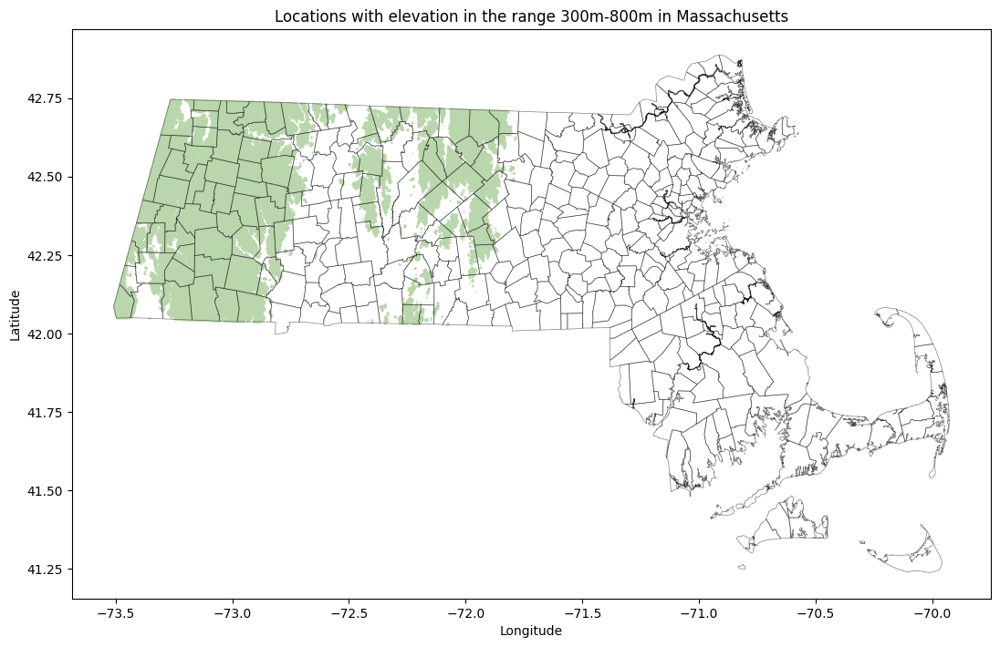

In [5]:
# plotting a map of areas with only elevation of 300m or more and 800m or less
ele300 = gdf[gdf['Elevation'] > 300]
ele300 = ele300[ele300['Elevation'] < 800]

# plotting the altitude data, and the boundaries of the towns in Massachusetts defined by the shapefile
fig, ax = plt.subplots(1, figsize=(13, 13))
ele300.plot(ax=ax, color= (0.725, 0.839, 0.675),
            legend=False, linewidth=0, edgecolor='black', aspect='auto', markersize=1)
munis.boundary.plot(ax=ax, edgecolor='black',linewidth=0.5, aspect='auto', alpha=0.5)

# adding information and details to the visualization 
ax.set_title('Locations with elevation in the range 300m-800m in Massachusetts')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

plt.show()

### Wind speed analysis

In [6]:
munis['pop_density'] = munis.POP2010 / munis.SQUARE_MIL
munis.sort_values(by='pop_density', ascending=False).describe()
pop = munis.loc[munis.groupby('TOWN')['SQUARE_MIL'].idxmax()]
pop = pop.to_crs(epsg=4326)

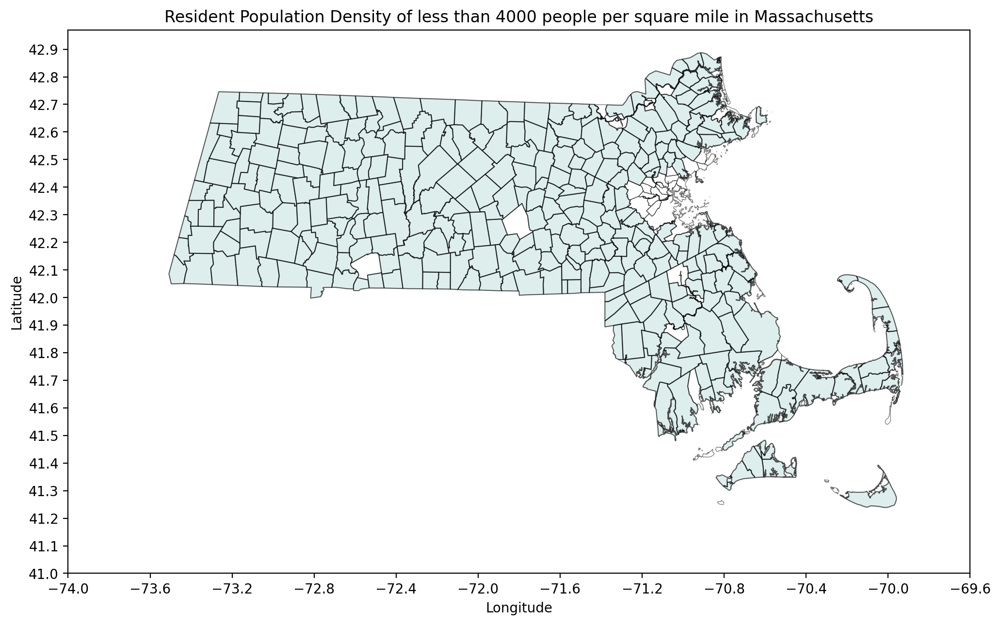

In [7]:
pop4000 = pop[pop['pop_density'] < 4000]
fig, ax = plt.subplots(figsize=(12, 8), dpi=200)
pop4000.plot(ax=ax, color= (0.675, 0.839, 0.831),
                 linewidth=0.8, edgecolor='black', aspect='auto', vmax=10000, alpha=0.4)
munis.boundary.plot(ax=ax, edgecolor='black',linewidth=0.5, aspect='auto', alpha=0.5)

# Customize the plot
ax.set_title('Resident Population Density of less than 4000 people per square mile in Massachusetts')

ax.set_yticks(np.arange(41, 43, 0.1))
ax.set_xticks(np.arange(-74, -69.4, 0.4))
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

plt.show()

### Proof of Concept for Overlaying DFs

In [8]:
newdf = pop4000.overlay(ele300, how="intersection", keep_geom_type=False)

Text(189.81944444444443, 0.5, 'Latitude')

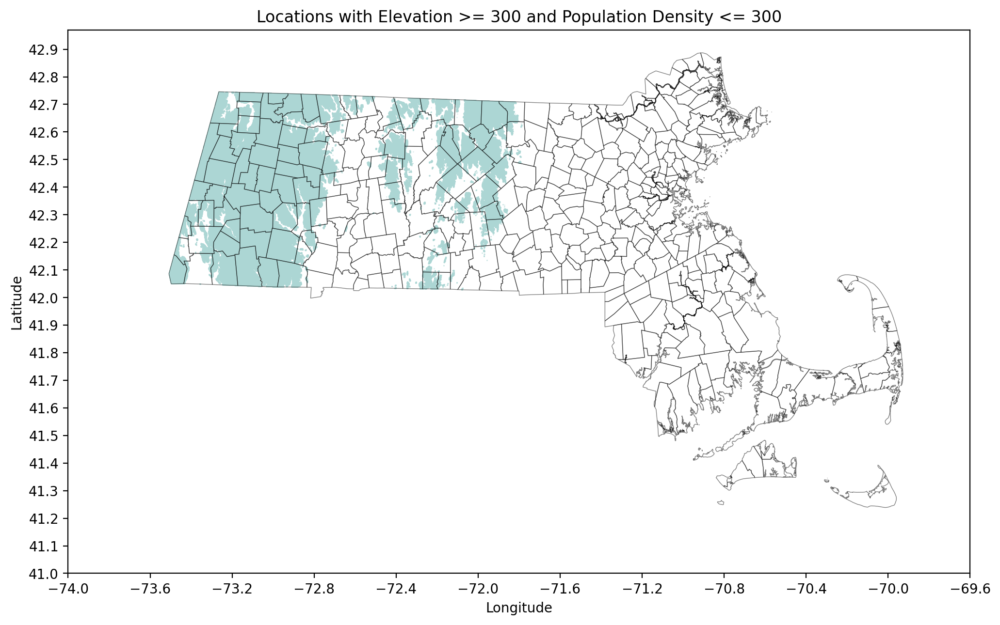

In [9]:
fig, ax = plt.subplots(figsize=(12, 8), dpi=200)
newdf.plot(ax=ax, color= (0.675, 0.839, 0.831),
                 linewidth=0, edgecolor='black', aspect='auto', vmax=10000, alpha=0.4, markersize=1)
munis.boundary.plot(ax=ax, edgecolor='black',linewidth=0.5, aspect='auto', alpha=0.5)

# Customize the plot
ax.set_title('Locations with Elevation >= 300 and Population Density <= 300')

ax.set_yticks(np.arange(41, 43, 0.1))
ax.set_xticks(np.arange(-74, -69.4, 0.4))
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

### Proof of Concept 2: Overlaying without any set operations like intersection

<Axes: >

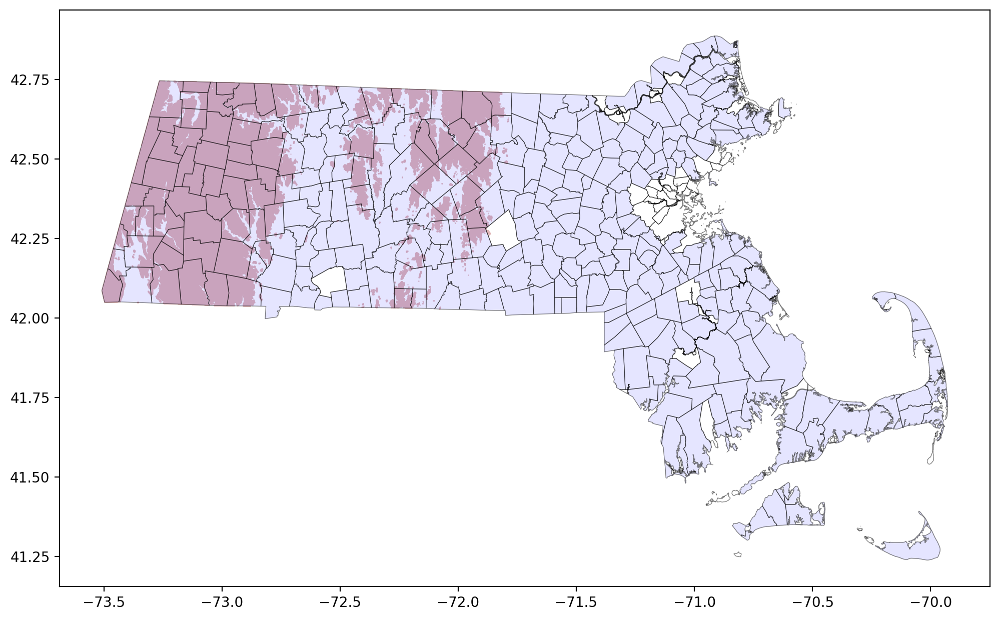

In [10]:
fig, ax = plt.subplots(figsize=(12, 8), dpi=200)
ele300.plot(ax=ax, color=(0.878, 0.714, 0.714),
                 linewidth=0, edgecolor='black', aspect='auto', vmax=10000, alpha=0.5, markersize=1)
pop4000.plot(ax=ax, color='blue',
                 linewidth=0, edgecolor='black', aspect='auto', vmax=10000, alpha=0.1, markersize=1)
munis.boundary.plot(ax=ax, edgecolor='black',linewidth=0.5, aspect='auto', alpha=0.5)

### Wind Speed

In [11]:
fp = '../windspeedgrid/WINDSPEEDGRID_POLY.shp'
wind = gpd.read_file(fp)
wind6 = wind6.to_crs(epsg=4326)

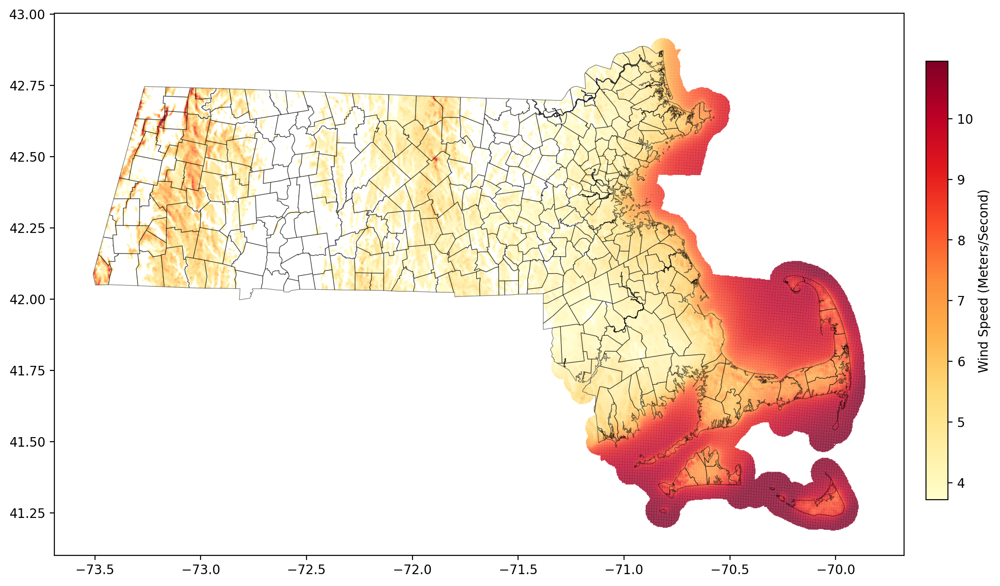

In [13]:
fig, ax = plt.subplots(figsize=(12, 8), dpi=200)

wind6.plot(ax=ax, column='SPD100', cmap='YlOrRd', 
          linewidth=0, edgecolor='black', aspect='auto', vmax=9.5)

# Overlay only the edges of the filtered_df plot
munis.boundary.plot(ax=ax, edgecolor='black', linewidth=0.5, aspect='auto', alpha=0.5)

# Modify color bar size
cax = fig.add_axes([0.92, 0.2, 0.02, 0.6])  # [left, bottom, width, height]
sm = plt.cm.ScalarMappable(cmap='YlOrRd')
sm.set_array(wind['SPD100'])
cbar = fig.colorbar(sm, cax=cax)
cbar.set_label('Wind Speed (Meters/Second)')

plt.show()

### Current wind farms

In [14]:
# load the data
farms = pd.read_csv('wind_farm_loc.csv')
# renaming the columns for clarity
farms = farms.rename(columns={"xlong":"longitude", "ylat":"latitude"})
# dropping the row and col columns, as they are not needed for our analysis
farms = farms.loc[:, ['longitude', 'latitude']]
farms = farms.dropna()

In [15]:
geometry = [Point(xy) for xy in zip(farms.longitude, farms.latitude)]
farms = farms.drop(['longitude', 'latitude'], axis=1)
gdf = gpd.GeoDataFrame(farms, crs="EPSG:4326", geometry=geometry)
gdf.head()

,geometry
0,POINT (-99.77596 36.45810)
1,POINT (-99.75134 36.44667)
2,POINT (-99.73572 36.42336)
3,POINT (-99.78237 36.48446)
4,POINT (-99.78209 36.47354)


In [16]:
# downloading the shapefile for the US states
us_shp = gpd.read_file('../altitude/us_shapefile/s_08mr23.shp')
# extracting the shapefile for Massachusetts to use with the elevation package
mass = us_shp[us_shp['NAME'] == "Massachusetts"]
polygon = unary_union(mass['geometry'].values)
polygon

In [17]:
farms_clipped = gdf.clip(polygon)

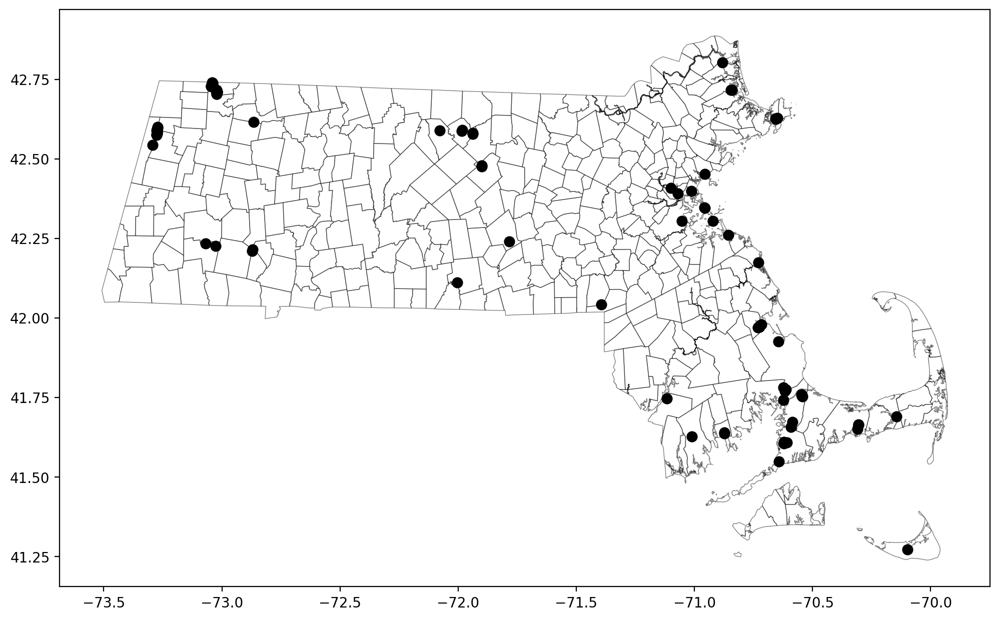

In [18]:
fig, ax = plt.subplots(figsize=(12, 8), dpi=200)

farms_clipped.plot(ax=ax, color='black',
          linewidth=2, edgecolor='black', aspect='auto', vmax=9.5)

# Overlay only the edges of the filtered_df plot
munis.boundary.plot(ax=ax, edgecolor='black', linewidth=0.5, aspect='auto', alpha=0.5)

plt.show()

### Wind Power 

In [29]:
fp = '../windpower/WINDPOWERGRID50_POLY.shp'
power = gpd.read_file(fp)
power = power.to_crs(epsg=4326)

power

,OBJECTID,AWS_CLASS,PWRDENSITY,SHAPE_AREA,SHAPE_LEN,geometry
0,1,1,100-200,1.444759e+10,1.257512e+07,"MULTIPOLYGON (((-72.99369 42.14944, -72.99364 ..."
1,2,2,200-300,2.020904e+09,2.140047e+06,"MULTIPOLYGON (((-71.06436 41.53853, -71.06439 ..."
2,3,4,400-500,1.240219e+09,1.380091e+06,"POLYGON ((-70.59052 42.73401, -70.59050 42.733..."
3,4,5,500-600,1.973090e+09,1.124440e+06,"MULTIPOLYGON (((-70.08143 42.01132, -70.07967 ..."
4,5,-1,0-100,2.232621e+08,5.480787e+05,"MULTIPOLYGON (((-72.62715 42.67763, -72.62704 ..."
...,...,...,...,...,...,...
4201,3780,5,500-600,4.002203e+04,8.002203e+02,"POLYGON ((-70.06058 41.99891, -70.06255 41.998..."
4202,3781,2,200-300,4.000823e+04,8.000823e+02,"POLYGON ((-70.78177 41.98458, -70.78199 41.984..."
4203,3782,2,200-300,5.001101e+06,1.800198e+04,"POLYGON ((-70.75281 41.98502, -70.75277 41.983..."
4204,3783,2,200-300,8.004482e+04,1.200336e+03,"POLYGON ((-70.03660 41.99192, -70.03829 41.991..."


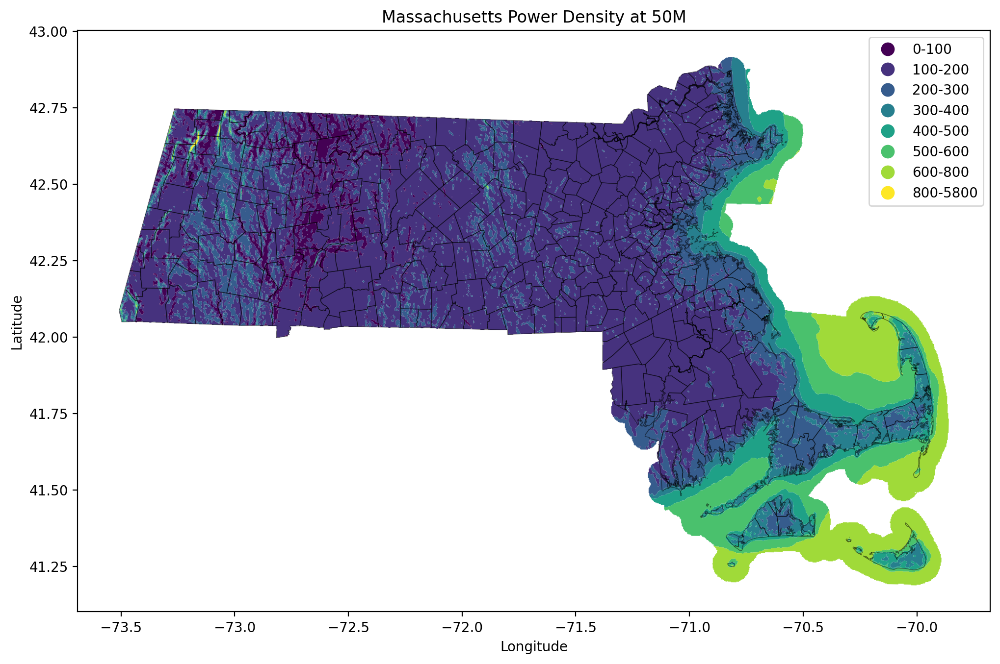

In [39]:
fig, ax = plt.subplots(figsize=(12, 8), dpi=200)
plt.title('Massachusetts Power Density at 50M')

power.plot(ax=ax, column='PWRDENSITY', cmap='viridis', 
          linewidth=0, edgecolor='black', aspect='auto', legend=True)

munis.boundary.plot(ax=ax, edgecolor='black', linewidth=0.5, aspect='auto', alpha=0.5)

ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

plt.show()

In [44]:
# the value is a range, filtering is weird but decently easy due to discrete range
power = power[power['PWRDENSITY'] != "0-100"]
power = power[power['PWRDENSITY'] != "100-200"]
power = power[power['PWRDENSITY'] != "200-300"]
power

,OBJECTID,AWS_CLASS,PWRDENSITY,SHAPE_AREA,SHAPE_LEN,geometry
2,3,4,400-500,1.240219e+09,1.380091e+06,"POLYGON ((-70.59052 42.73401, -70.59050 42.733..."
3,4,5,500-600,1.973090e+09,1.124440e+06,"MULTIPOLYGON (((-70.08143 42.01132, -70.07967 ..."
5,6,3,300-400,1.073207e+09,1.573430e+06,"POLYGON ((-70.94175 42.32240, -70.93933 42.322..."
6,7,3,300-400,1.237690e+06,7.592910e+03,"POLYGON ((-73.00869 42.65229, -73.00876 42.653..."
13,14,3,300-400,3.997668e+04,7.997668e+02,"POLYGON ((-71.89843 42.70021, -71.89970 42.700..."
...,...,...,...,...,...,...
4197,3776,4,400-500,1.600892e+05,1.600446e+03,"POLYGON ((-70.04230 42.00628, -70.04335 42.006..."
4198,3777,4,400-500,2.401349e+05,2.800787e+03,"POLYGON ((-70.02404 42.00645, -70.02402 42.005..."
4199,3778,4,400-500,4.002207e+04,8.002206e+02,"POLYGON ((-70.05740 42.00614, -70.05784 42.006..."
4200,3779,6,600-800,8.004348e+04,1.200326e+03,"POLYGON ((-70.08163 42.00232, -70.08193 42.002..."


### Plotting the final graph with everything overlaid

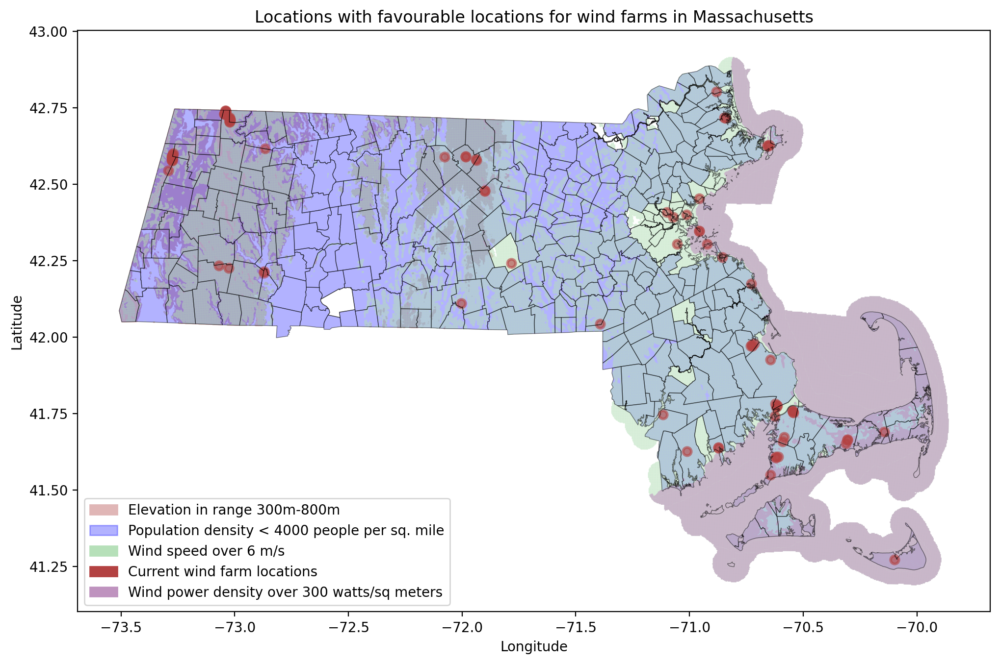

In [48]:
fig, ax = plt.subplots(figsize=(12, 8), dpi=200)

e = ele300.plot(ax=ax, color=(0.878, 0.714, 0.714),
                 linewidth=0, edgecolor='black', alpha=0.2, markersize=1)
p = pop4000.plot(ax=ax, color='blue',
                 linewidth=0, edgecolor='black', alpha=0.3, markersize=1)
w = wind6.plot(ax=ax, color=(0.714, 0.878, 0.725), 
          linewidth=0, edgecolor='black', alpha=0.6)
p = power.plot(ax=ax, color=(0.749, 0.576, 0.749), linewidth=0, edgecolor='black', alpha=0.6)
f = farms_clipped.plot(ax=ax, color=(0.702, 0.259, 0.259),
          linewidth=2, edgecolor=(0.702, 0.259, 0.259), alpha=0.6)
m = munis.boundary.plot(ax=ax, edgecolor='black', linewidth=0.5, aspect='auto', alpha=0.5)

ax.set_title('Locations with favourable locations for wind farms in Massachusetts')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

# custom defining a legend as legend does not support handles for PatchCollection instances
ele_legend = mpatches.Patch(color=(0.878, 0.714, 0.714), label='Elevation in range 300m-800m')
pop_legend = mpatches.Patch(color='blue', alpha=0.3, label="Population density < 4000 people per sq. mile")
wind_legend = mpatches.Patch(color=(0.714, 0.878, 0.725), label="Wind speed over 6 m/s")
farm_legend = mpatches.Patch(color=(0.702, 0.259, 0.259), label="Current wind farm locations")
power_legend = mpatches.Patch(color=(0.749, 0.576, 0.749), label="Wind power density over 300 watts/sq meters")

plt.legend(handles=[ele_legend, pop_legend, wind_legend, farm_legend, power_legend])

plt.show()

In [5]:
import georasters as gr
import pandas as pd

# combining everything into csv files
root = "../csv_files/"

# reading in the geotiff file
ele = gr.from_file("mass_clipped.tif")
ele = ele.to_pandas()
ele = ele.rename(columns={True:"Elevation", "x":"Longitude", "y":"Latitude"})
ele = ele.drop(['row', 'col'],axis=1)
ele.to_csv("../csv_files/elevation.csv", index=False)

In [20]:
import geopandas as gpd

# reading the shapefile for towns in masachusetts
munis = gpd.read_file('../altitude/shapefile_mass/TOWNSSURVEY_POLY.shp')
munis = munis.to_crs(epsg=4326)
munis['Population_Density'] = munis.POP2010 / munis.SQUARE_MIL
munis.sort_values(by='Population_Density', ascending=False).describe()
pop = munis.loc[munis.groupby('TOWN')['SQUARE_MIL'].idxmax()]
pop = pop.to_crs(epsg=4326)
pop = pop.drop(["TOWN_ID","POP1980","POP1990","POP2000","POPCH90_00","TYPE","ISLAND","COASTAL_PO","FOURCOLOR","FIPS_STCO","CCD_MCD","FIPS_PLACE","FIPS_MCD","FIPS_COUNT","ACRES","POPCH00_10","POPCH80_90","SHAPE_AREA","SHAPE_LEN"], axis=1)
pop

,TOWN,SQUARE_MIL,POP2010,geometry,Population_Density
390,ABINGTON,10.190,15985,"POLYGON ((-70.91591 42.10012, -70.94684 42.094...",1568.694799
512,ACTON,20.295,21924,"POLYGON ((-71.38495 42.50446, -71.43039 42.436...",1080.266075
1112,ACUSHNET,18.878,10303,"POLYGON ((-70.86500 41.70016, -70.85821 41.681...",545.767560
1204,ADAMS,22.960,8485,"POLYGON ((-73.06328 42.65470, -73.06364 42.649...",369.555749
1153,AGAWAM,24.335,28438,"POLYGON ((-72.68266 42.10631, -72.68262 42.106...",1168.604890
...,...,...,...,...,...
384,WOBURN,12.943,38120,"POLYGON ((-71.11976 42.50029, -71.12174 42.498...",2945.221355
327,WORCESTER,38.441,181045,"POLYGON ((-71.76827 42.31126, -71.75854 42.296...",4709.684972
332,WORTHINGTON,32.103,1156,"POLYGON ((-72.88081 42.43301, -72.90458 42.430...",36.009096
916,WRENTHAM,22.602,10955,"POLYGON ((-71.28508 42.08239, -71.28770 42.076...",484.691620


In [21]:
pop.to_csv("../csv_files/population_density.csv", index=False)

In [18]:
fp = '../windspeedgrid/WINDSPEEDGRID_POLY.shp'
wind = gpd.read_file(fp)
wind = wind.to_crs(epsg=4326)
wind = wind.drop(["OBJECTID","GRID250M_3","SHAPE_AREA","SHAPE_LEN"], axis=1)

wind

,SPD30,SPD50,SPD70,SPD100,geometry
0,6.2992,6.7000,7.0464,7.4090,"POLYGON ((-70.78980 42.90645, -70.78674 42.906..."
1,5.2796,5.8526,6.3540,6.8621,"POLYGON ((-70.84186 42.90451, -70.83880 42.904..."
2,6.0316,6.4565,6.8431,7.2183,"POLYGON ((-70.81125 42.90433, -70.80819 42.904..."
3,5.2042,5.7681,6.2271,6.7320,"POLYGON ((-70.85719 42.90235, -70.85413 42.902..."
4,5.1873,5.7536,6.2225,6.7360,"POLYGON ((-70.85417 42.89783, -70.85111 42.897..."
...,...,...,...,...,...
437629,7.9743,8.5339,8.9720,9.4923,"POLYGON ((-70.11428 41.19632, -70.11130 41.196..."
437630,7.9646,8.5267,8.9636,9.4869,"POLYGON ((-70.07554 41.19584, -70.07256 41.195..."
437631,7.9616,8.5242,8.9613,9.4852,"POLYGON ((-70.07256 41.19580, -70.06958 41.195..."
437632,8.0818,8.6482,9.0779,9.5953,"POLYGON ((-69.98020 41.19460, -69.97722 41.194..."


In [19]:
wind.to_csv("../csv_files/wind_speed.csv", index=False)

In [26]:
fp = '../windpower/WINDPOWERGRID50_POLY.shp'
power = gpd.read_file(fp)
power = power.to_crs(epsg=4326)
power

,OBJECTID,AWS_CLASS,PWRDENSITY,SHAPE_AREA,SHAPE_LEN,geometry
0,1,1,100-200,1.444759e+10,1.257512e+07,"MULTIPOLYGON (((-72.99369 42.14944, -72.99364 ..."
1,2,2,200-300,2.020904e+09,2.140047e+06,"MULTIPOLYGON (((-71.06436 41.53853, -71.06439 ..."
2,3,4,400-500,1.240219e+09,1.380091e+06,"POLYGON ((-70.59052 42.73401, -70.59050 42.733..."
3,4,5,500-600,1.973090e+09,1.124440e+06,"MULTIPOLYGON (((-70.08143 42.01132, -70.07967 ..."
4,5,-1,0-100,2.232621e+08,5.480787e+05,"MULTIPOLYGON (((-72.62715 42.67763, -72.62704 ..."
...,...,...,...,...,...,...
4201,3780,5,500-600,4.002203e+04,8.002203e+02,"POLYGON ((-70.06058 41.99891, -70.06255 41.998..."
4202,3781,2,200-300,4.000823e+04,8.000823e+02,"POLYGON ((-70.78177 41.98458, -70.78199 41.984..."
4203,3782,2,200-300,5.001101e+06,1.800198e+04,"POLYGON ((-70.75281 41.98502, -70.75277 41.983..."
4204,3783,2,200-300,8.004482e+04,1.200336e+03,"POLYGON ((-70.03660 41.99192, -70.03829 41.991..."


In [27]:
power = power.drop(["AWS_CLASS", "SHAPE_AREA", "SHAPE_LEN", "OBJECTID"], axis=1)

In [28]:
power

,PWRDENSITY,geometry
0,100-200,"MULTIPOLYGON (((-72.99369 42.14944, -72.99364 ..."
1,200-300,"MULTIPOLYGON (((-71.06436 41.53853, -71.06439 ..."
2,400-500,"POLYGON ((-70.59052 42.73401, -70.59050 42.733..."
3,500-600,"MULTIPOLYGON (((-70.08143 42.01132, -70.07967 ..."
4,0-100,"MULTIPOLYGON (((-72.62715 42.67763, -72.62704 ..."
...,...,...
4201,500-600,"POLYGON ((-70.06058 41.99891, -70.06255 41.998..."
4202,200-300,"POLYGON ((-70.78177 41.98458, -70.78199 41.984..."
4203,200-300,"POLYGON ((-70.75281 41.98502, -70.75277 41.983..."
4204,200-300,"POLYGON ((-70.03660 41.99192, -70.03829 41.991..."


In [29]:
power.to_csv("../csv_files/power_density.csv", index=False)